# O que é xG? 

#### Do inglês expected goals, o termo xG diz respeito à probabilidade de uma finalização no jogo de futebol terminar em gol dado algumas de suas características. Nesse sentido, é uma medida estatística que mede a qualidade de um chute.

# Por que xG é importante?

#### O xG conta uma história sobre uma partida ou partidas recentes de um clube/campeonato/jogador específico. Elas predizem, por exemplo, os gols de uma equipe para a próxima partida melhor do que o próprio número de gols feitos pela equipe até então. Assim, a métrica é muito importante na ajuda a treinadores e jogadores em tomadas de decisões. Por exemplo: de onde o jogador/a equipe mais finaliza, direcionamentos nos treinamentos do time visando finalizações de regiões e contextos com maior probabilidade de gol etc.

# Como é calculado?

#### O seu cálculo é bem simples: Dividimos o total de gols feitos por cada região do campo pelo total de chutes dados daquela região. Assim, nós temos a resposta para a pergunta: qual a porcentagem de chutes que resultam em gol de cada local do campo? Esta é a base do modelo xG, porém outras variáveis podem ser adicionadas, tais como: 1) ângulo do jogador no momento do chute; 2) O chute é proveniente de um contra ataque ou da equipe em organização ofensiva; de um pênalti ou de uma falta?; 3) a distância do jogador em relação ao gol... dentre outras que foram utilizadas neste projeto.

# Importação das bibliotecas e leitura dos Dados

In [1]:
#Manipulação dos dados
import numpy as np
import pandas as pd

#Visuzalização
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image
import FCPython
from funcoes_projeto import *

#Ajustes estatísticos do modelo
import statsmodels.api as sm
import statsmodels.formula.api as smf

#Métricas de performance do modelo
from sklearn.metrics import roc_auc_score, classification_report, roc_curve, accuracy_score, precision_score, confusion_matrix


#Tamanho padrão das fontes nas figuras feitas com o seaborn neste notebook
sns.set(font_scale=1.5)

#Tamanho padrão das figuras neste notebook
plt.rcParams["figure.figsize"] = [14, 8]

In [2]:
chutes_modelo= pd.read_csv('todos_os_chutes_modelo.csv')

# Total de Finalizações por Campeonato

In [3]:
finalizacoes_por_campeonato= chutes_modelo.groupby(by= 'Campeonato')['Gol'].count().sort_values(ascending= False)

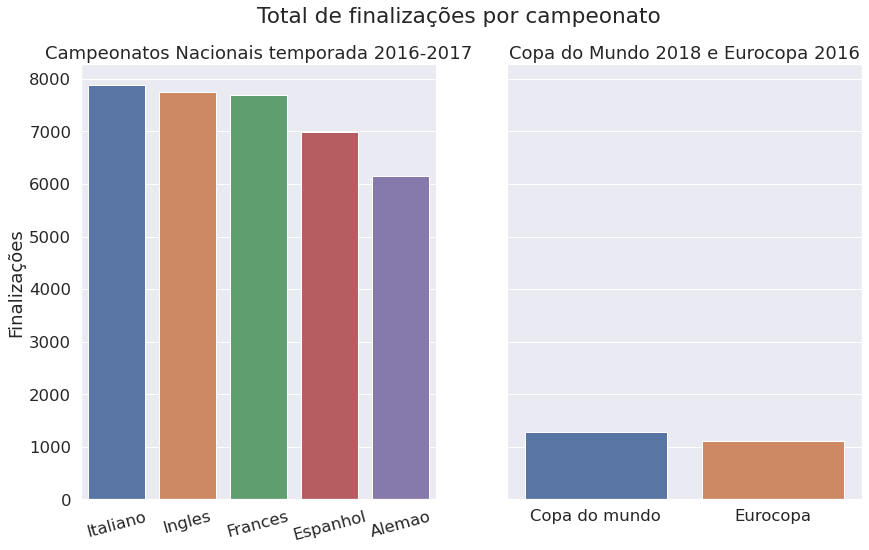

In [4]:
fig, axes = plt.subplots(1, 2, figsize=(14, 8), sharey= True)
fig.suptitle('Total de finalizações por campeonato')
#Por clubes
axes[0].set_title('Campeonatos Nacionais temporada 2016-2017')
sns.barplot(x=finalizacoes_por_campeonato.index[:5], y= finalizacoes_por_campeonato.values[:5], ax=axes[0])
axes[0].set_ylabel('Finalizações'), axes[0].set_xlabel('')
axes[0].set_xticklabels(labels= [x.capitalize() for x in finalizacoes_por_campeonato.index[:5]], rotation=15);

#Por seleções
axes[1].set_title('Copa do Mundo 2018 e Eurocopa 2016')
sns.barplot(x=finalizacoes_por_campeonato.index[5:7], y= finalizacoes_por_campeonato.values[5:7], ax=axes[1])
axes[1].set_ylabel(''), axes[1].set_xlabel('')
axes[1].set_xticklabels(labels= [x.capitalize() for x in finalizacoes_por_campeonato.index[5:7]]);

#Salvando imagem
fig.savefig('Imagens/NumeroDeChutesPorCampeonato.pdf', dpi=None, bbox_inches="tight")

# Número de finalizações e gols de acordo com a região do campo

In [5]:
#Histograma de duas dimensões: eixo x e y do chute sem considerar os pênaltis
H_Chute=np.histogram2d(chutes_modelo[~chutes_modelo['subEventoNome'].isin(['Penalty'])]['X'], 
                       chutes_modelo[~chutes_modelo['subEventoNome'].isin(['Penalty'])]['Y'], 
                       bins=50, range=[[0, 100],[0, 100]])

gols=chutes_modelo[~chutes_modelo['subEventoNome'].isin(['Penalty']) & chutes_modelo['Gol']==1]

H_Gol=np.histogram2d(gols['X'], gols['Y'], bins=50, range=[[0, 100],[0, 100]])

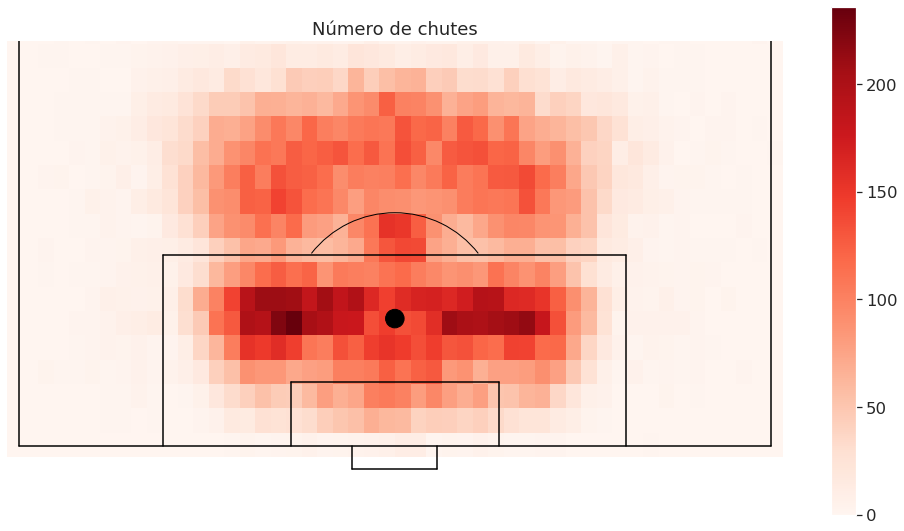

In [6]:
#Número de chutes de diferentes regiões do campo
(fig,ax) = FCPython.createGoalMouth()
pos=ax.imshow(H_Chute[0], extent=[-1,66,104,-1], aspect='auto',cmap=plt.cm.Reds)
fig.colorbar(pos, ax=ax)
ax.set_title('Número de chutes')
plt.xlim((-1,66))
plt.ylim((-3,35))
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box');
fig.savefig('Imagens/NumeroDeChutes.pdf', dpi=None, bbox_inches="tight")

### No gráfico acima, quanto mais vermelho, mais finalizações houve daquela região específica. Podemos perceber que a maioria dos chutes se dão em regiões centralizadas em relação ao gol e mais próximos à area.

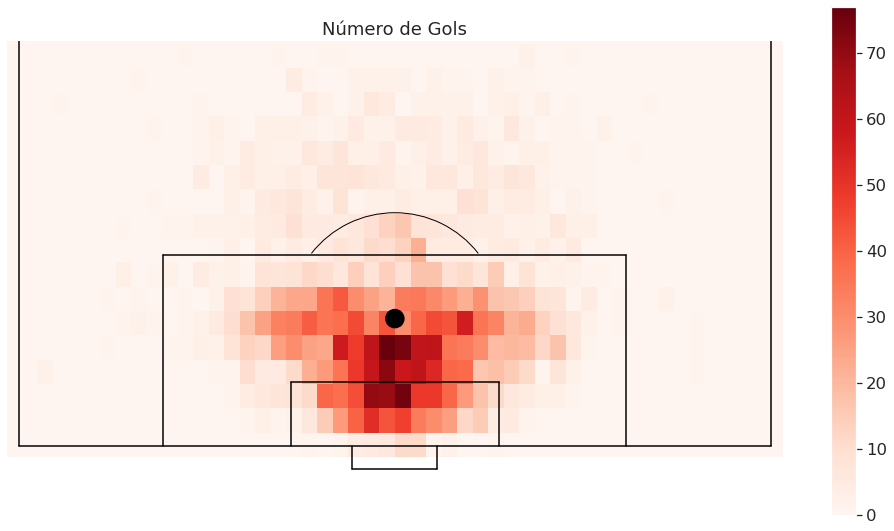

In [7]:
#Número de gols marcados de diferentes regiões do campo
(fig,ax) = FCPython.createGoalMouth()
pos=ax.imshow(H_Gol[0], extent=[-1,66,104,-1], aspect='auto',cmap=plt.cm.Reds)
fig.colorbar(pos, ax=ax)
ax.set_title('Número de Gols')
plt.xlim((-1,66))
plt.ylim((-3,35))
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box');
fig.savefig('Imagens/NumerodeGols.pdf', dpi=None, bbox_inches="tight")

### Quando olhamos para as regiões de gols marcados, por sua vez, vemos que a "regra" se acentua, sendo os gols marcados de regiões ainda mais próximas e centralizadas em relação ao gol. Existe um termo (abrasileirado) que identifica as áreas mais avermelhadas nos gráficos: o funil. Baseado em pesquisas, com maior quantidade de dados do que temos, chegou-se a conclusão de quais regiões mais devem ser defendidas pelas equipes de futebol e tratadas como "zonas de guerra" por serem mais perigosas. Essas zonas são justamente as zonas mostradas acima.

<ipython-input-8-878f8159e544>:3: RuntimeWarning: invalid value encountered in true_divide
  pos=ax.imshow(H_Gol[0]/H_Chute[0], extent=[-1,66,104,-1], aspect='auto',cmap=plt.cm.Reds,vmin=0, vmax=0.5)


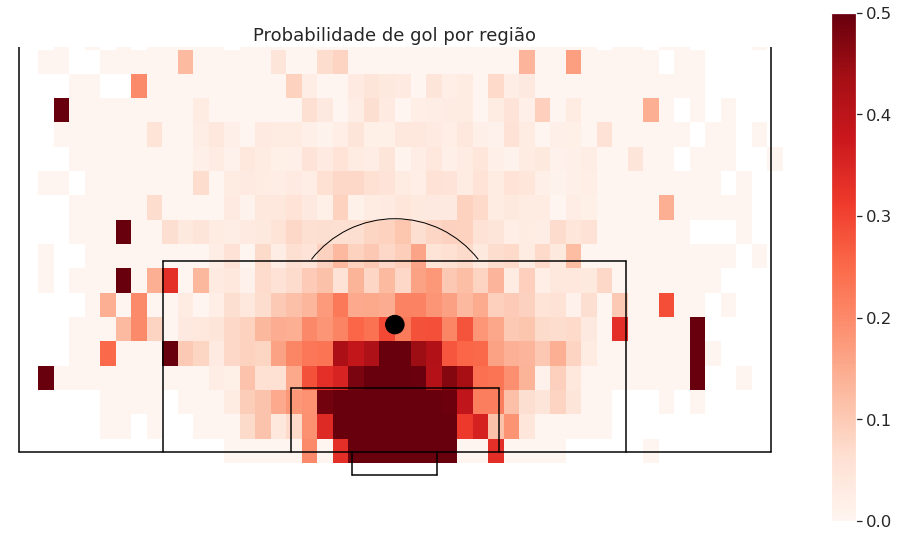

In [8]:
#Probabilidade de fazer o gol de acordo com diferentes regiões do campo
(fig,ax) = FCPython.createGoalMouth()
pos=ax.imshow(H_Gol[0]/H_Chute[0], extent=[-1,66,104,-1], aspect='auto',cmap=plt.cm.Reds,vmin=0, vmax=0.5)
fig.colorbar(pos, ax=ax)
ax.set_title('Probabilidade de gol por região')
plt.xlim((-1,66))
plt.ylim((-3,35))
plt.tight_layout()
plt.gca().set_aspect('equal', adjustable='box');
fig.savefig('Imagens/ProbabilidadeDeGol.pdf', dpi=None, bbox_inches="tight")

### Já a proporção de gols que foram marcados por chutes dados das regiões temos alguns chutes com alta proporção (cores mais escuras) de regiões não centralizadas e distantes da baliza. Isto não nos indica, de fato, que aquela região tem uma alta probabilidade de um gol ser marcado. Como estamos fazendo o cálculo gols feitos divido pelos chutes dados, estas regiões na verdade são regiões com um ou dois chutes feitos, mas que resultaram em gol(s). A probabilidade acaba sendo alta, mas sabemos que esses gols/chutes são menos comuns e isso é o que também dá o fascínio ao jogo: o improvável, o não comum!

[Neste vídeo](https://www.youtube.com/watch?v=AJGYSmrUmMU) o ex treinador do Corinthians,  Fábio Carille,  fala sobre o funil.

# Fitando modelo de regressão logística

#### O que define a base de uma curva logística: O eixo y nos dá a probabilidade (intervalo entre 0 e 1) de um evento ocorrer (em nosso caso, o gol) baseado nos valores que apresenta no eixo x. Estes eventos podem também indicar alguma classe, alguma característica de algum indivíduo. Por exemplo: se uma pesso possui (1) ou não (0) câncer. Para facilitar a visualização indicamos somente uma variável x que ajuda a predizer y, mas em termos matemáticos podemos ter mais variáveis adicionadas que ajudam a explicar a ocorrência ou não de y baseado em seus valores.

#### No caso da curva do exemplo abaixo o movimento da linha nos mostra que: quanto maior o valor de x menor a probabilidade de um evento ocorrer ou um indivíduo ter determinada característca e vice versa.

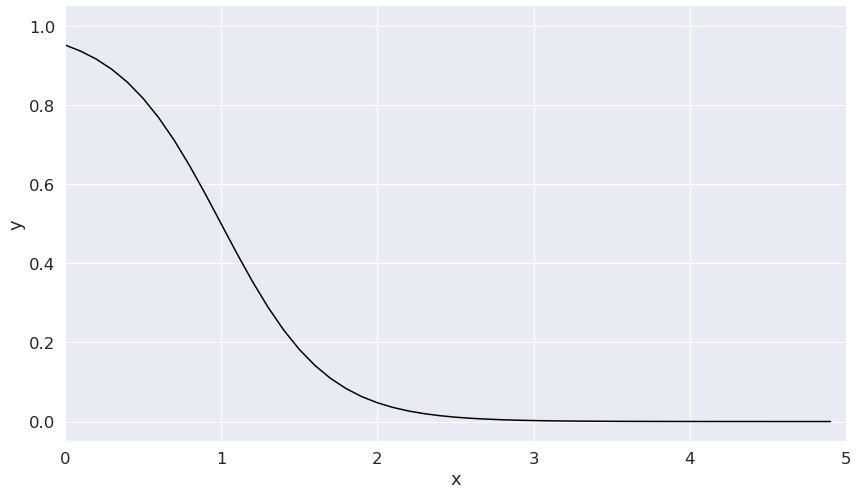

In [9]:
#Plot de curva logística
b=[3, -3]
x=np.arange(5,step=0.1)
y=1/(1+np.exp(-b[0]-b[1]*x))
fig,ax=plt.subplots(num=1)
plt.ylim((-0.05,1.05))
plt.xlim((0,5))
ax.set_ylabel('y')
ax.set_xlabel("x") 
ax.plot(x, y, linestyle='solid', color='black')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False);

# Ângulo

### Quando o jogador está numa posição mais centralizada em relação ao gol há o aumento do seu ângulo, isto é, ele tem uma visão maior de todo o gol. 

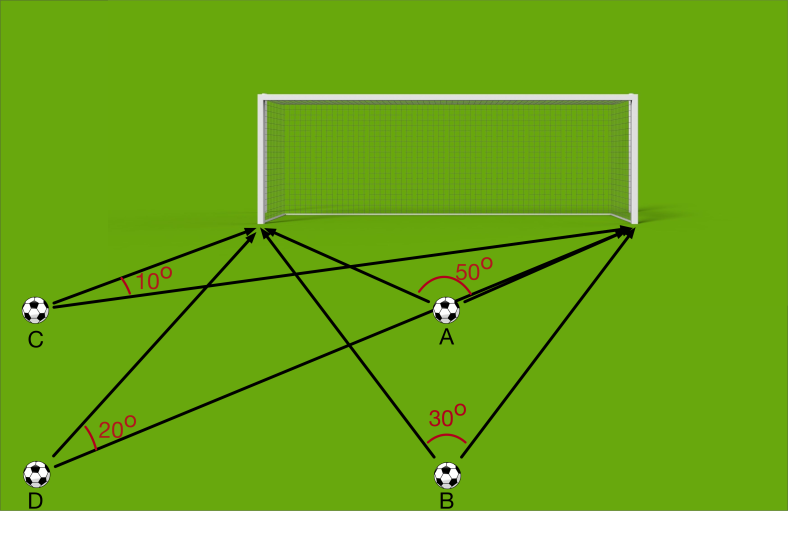

### Para compreender o conceito da curva logística de uma forma mais clara no problema que estamos analisando vamos plotar um gráfico de uma relação que uma curva logística poderia explicar: a probabilidade de um chute resultar em gol de acordo com o ângulo que o jogador tem da baliza no momento do chute.

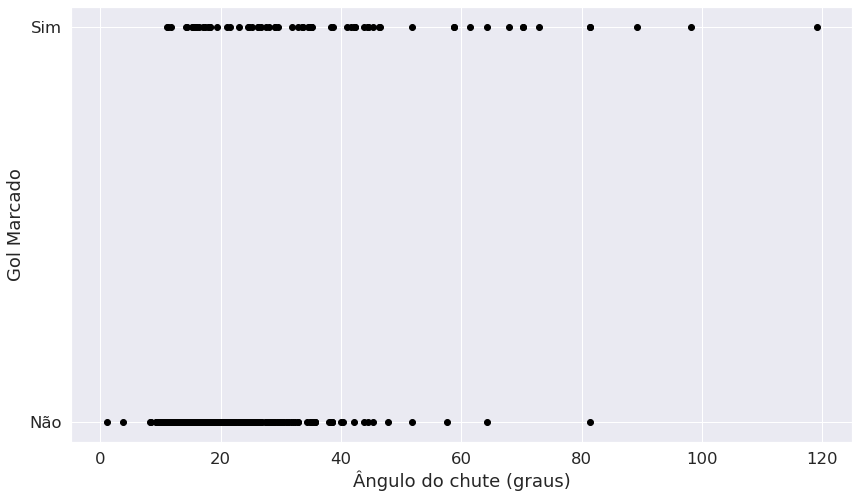

In [10]:
#Amostra aleatória de 500 chutes
df_amostra= chutes_modelo.sample(n=500, random_state=123)

#Plot dos chutes (se foram gols ou não) de acordo com o ângulo do chute
fig,ax=plt.subplots(num=1)
ax.plot(df_amostra['Angulo']*180/np.pi, df_amostra['Gol'], linestyle='none', 
        marker= '.', markerSize= 12, color='black')
ax.set_ylabel('Gol Marcado')
ax.set_xlabel("Ângulo do chute (graus)")
plt.ylim((-0.05,1.05))
ax.set_yticks([0,1])
ax.set_yticklabels(['Não','Sim']);
fig.savefig('Imagens/Gols_Angulo.pdf', dpi=None, bbox_inches="tight")

/home/fabiano/Documents/Projetos/modeloExpectativaDeGol/funcoes_projeto.py:53: RuntimeWarning: invalid value encountered in true_divide
  prob_gol_angulo=np.divide(total_gols_por_angulo[0], total_chutes_por_angulo[0])


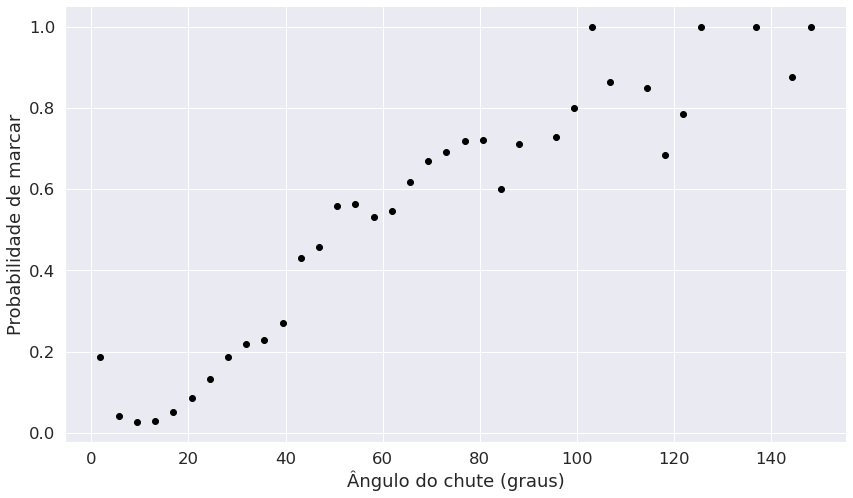

In [11]:
plot_prob()

### Cada círculo preto representa uma determinada quantidade de chutes; no eixo y (vertical) temos a probabilidade de marcar dos chutes e no eixo x (horizontal) temos o ângulo em que a finalização foi feita. Podemos ver que de fato a probabilidade de marcar aumenta com o aumento do ângulo em que o jogador tem quando finaliza. Nos indicando, com isso, uma variável possívelmente muito boa como preditora de um gol ser ou não marcado e, em termos analíticos, das qualidades das chances criadas por uma equipe, de um jogador, em um campeonato etc. A [relação entre o ângulo do chute e sua probabilidade de gol](https://soccermatics.medium.com/the-geometry-of-shooting-ae7a67fdf760)  é, portanto, bem forte. 

# Testando ajustes de Modelos

## Regressão Linear

/home/fabiano/Documents/Projetos/modeloExpectativaDeGol/funcoes_projeto.py:53: RuntimeWarning: invalid value encountered in true_divide
  prob_gol_angulo=np.divide(total_gols_por_angulo[0], total_chutes_por_angulo[0])


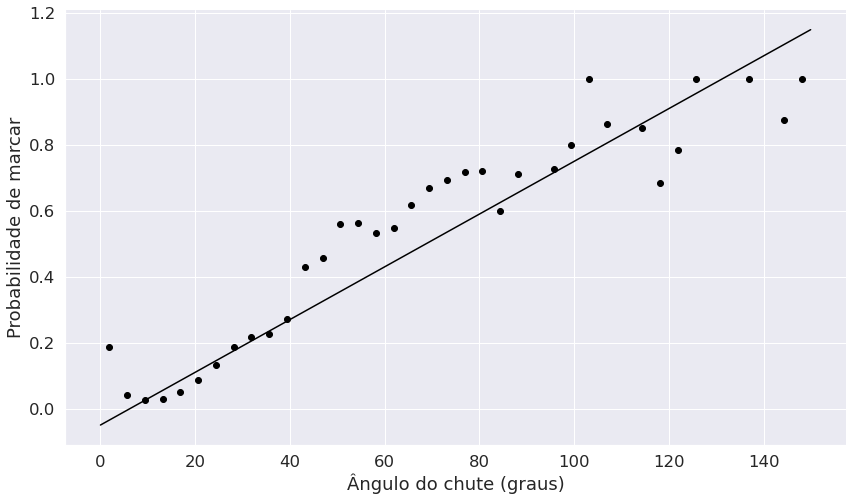

In [12]:
plot_prob(tipo= 'linear')

### A reta nos diz onde são as previsões do modelo para a probabilidade dos chutes dado o ângulo do atleta e os pontos pretos são as probabilidades reais. Quanto mais próximos os pontos estão da reta, melhores foram as previsões. Vemos que não temos um modelo tão ruim assim. Porém, o problema da regressão linear é que ela vai nos retornar valores menores que zero ou maiores que 1. Como estamos lidando com probabilidade (que vai de 0 a 1 -> de 0%  a  100%), esses valores não fazem sentido em nosso problema.

## Sigmoide

/home/fabiano/Documents/Projetos/modeloExpectativaDeGol/funcoes_projeto.py:53: RuntimeWarning: invalid value encountered in true_divide
  prob_gol_angulo=np.divide(total_gols_por_angulo[0], total_chutes_por_angulo[0])


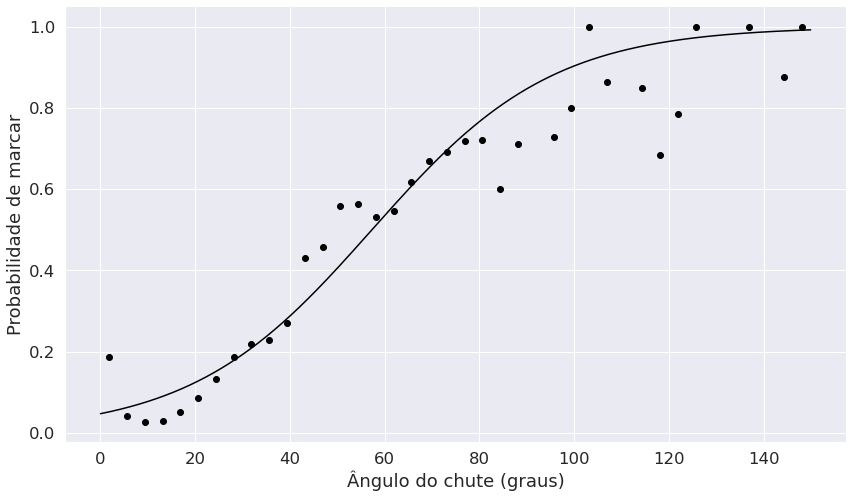

In [13]:
plot_prob(tipo= 'sigmoide')

### O modelo sigmoide é bom porque retorna justamente o valor de probabilidades que estamos analisando. Porém, como cada ponto contém vários chutes a curva acaba não fazendo um bom ajuste. 

## Likelihood

/home/fabiano/Documents/Projetos/modeloExpectativaDeGol/funcoes_projeto.py:53: RuntimeWarning: invalid value encountered in true_divide
  prob_gol_angulo=np.divide(total_gols_por_angulo[0], total_chutes_por_angulo[0])


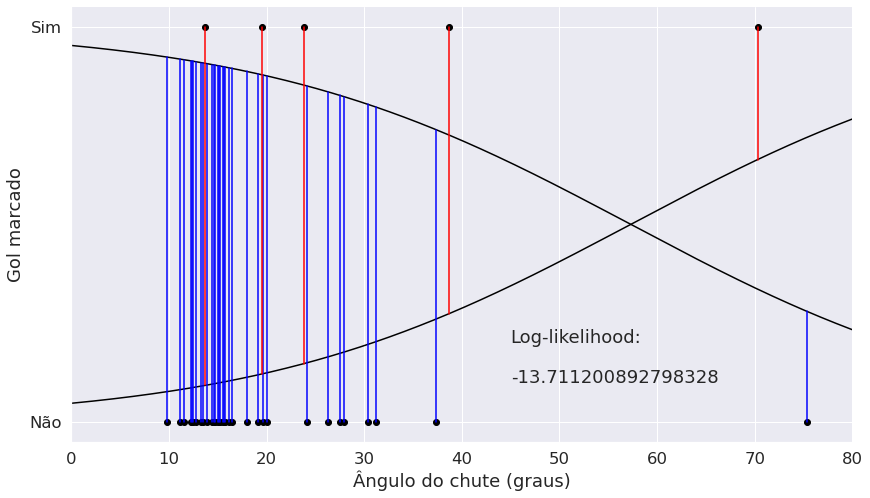

In [14]:
plot_prob(tipo= 'likelihood')

# Modelo somente com o ângulo do chute como variável preditora

#### Conseguimos achar os melhores coeficientes (b) usando regressão logística a partir da biblioteca statsmodel

In [15]:
#Esse processo minimiza o loglikelihood
modelo_teste = smf.glm(formula="Gol ~ " + escreve_modelo(['Angulo']) , data=chutes_modelo, 
                           family=sm.families.Binomial()).fit()
print(modelo_teste.summary())        

                 Generalized Linear Model Regression Results                  
Dep. Variable:                    Gol   No. Observations:                38868
Model:                            GLM   Df Residuals:                    38866
Model Family:                Binomial   Df Model:                            1
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11971.
Date:                Fri, 16 Apr 2021   Deviance:                       23942.
Time:                        21:51:29   Pearson chi2:                 4.15e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -3.9712      0.038   -103.363      0.0

Intercept   -3.971197
Angulo       4.595074
dtype: float64


/home/fabiano/Documents/Projetos/modeloExpectativaDeGol/funcoes_projeto.py:53: RuntimeWarning: invalid value encountered in true_divide
  prob_gol_angulo=np.divide(total_gols_por_angulo[0], total_chutes_por_angulo[0])


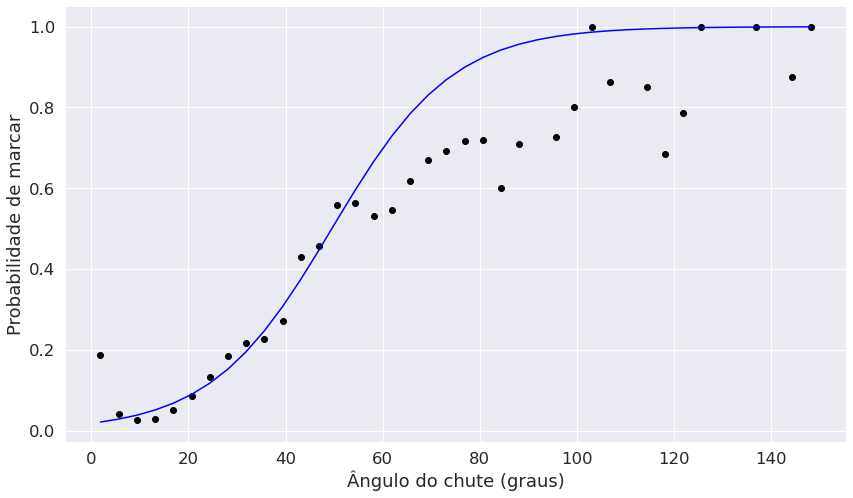

In [16]:
#Melhores parâmetros
b_angulo=modelo_teste.params
print(b_angulo)
plot_prob(tipo= 'likelihood otimizado angulo', b= -b_angulo)  

In [17]:
#Modelo utilizando somente a distância do gol como variável preditora
modelo_teste_dist = smf.glm(formula="Gol ~ " + escreve_modelo(['distanciaGol']), 
                            data=chutes_modelo[['Gol', 'distanciaGol']], 
                           family=sm.families.Binomial()).fit()
print(modelo_teste_dist.summary())        

                 Generalized Linear Model Regression Results                  
Dep. Variable:                    Gol   No. Observations:                38868
Model:                            GLM   Df Residuals:                    38866
Model Family:                Binomial   Df Model:                            1
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -12033.
Date:                Fri, 16 Apr 2021   Deviance:                       24066.
Time:                        21:51:30   Pearson chi2:                 1.97e+08
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        1.0347      0.043     23.823   

Intercept       1.034655
distanciaGol   -0.180723
dtype: float64


/home/fabiano/Documents/Projetos/modeloExpectativaDeGol/funcoes_projeto.py:53: RuntimeWarning: invalid value encountered in true_divide
  prob_gol_angulo=np.divide(total_gols_por_angulo[0], total_chutes_por_angulo[0])


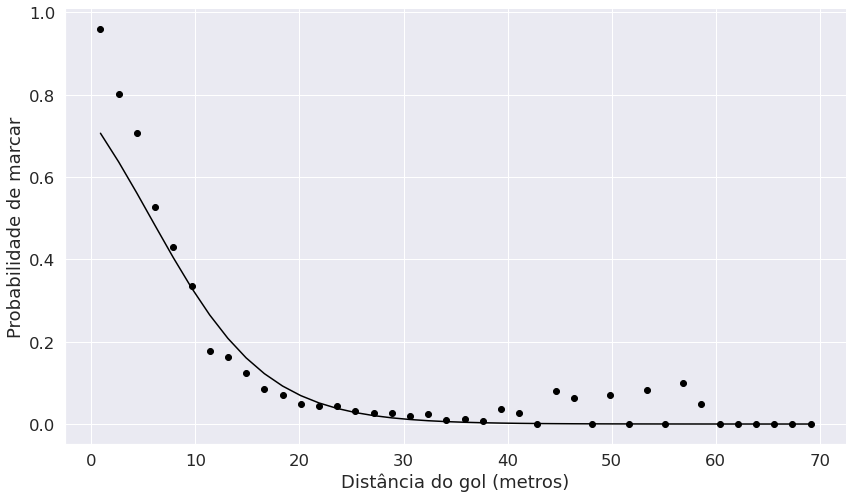

In [18]:
#Melhores parâmetros
b_distancia=modelo_teste_dist.params
print(b_distancia)
plot_prob(tipo= 'likelihood otimizado distancia', b= -b_distancia)  

### Vemos que temos um bom ajuste do modelo utilizando somente a variável ângulo e também temos um modelo relativamente bom utilizando somente a distância como variável preditora. O única problema desta é que ela coloca uma probabilidade de marcar de menos de 80% para chutes a zero metros do gol. Isto pode ter ligação com o fato de estarmos considerando todo campo como tendo a mesma profundidade e largura o que, claro, não é verdade. Neste caso, chutes que não foram dados de fato "em cima da linha" e não foram gols podem estar "enganando" o modelo.

#### 1ª Saída: criar uma nova variável indicando as distâncias ao quadrado e aumentando o "espaço" das distâncias;

####  2ª Saída: baseada no conhecimento do jogo, criar chutes a zero metros do gol que foram gols e assim aumentar a probabilidade de marcar daquela região.

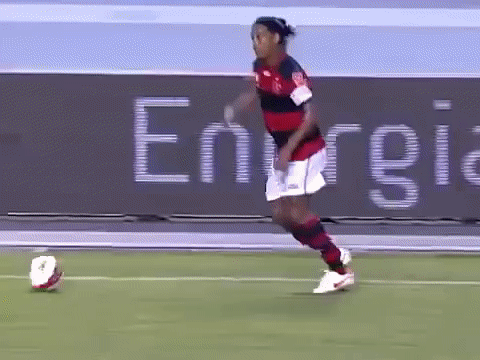

In [19]:
#GIF de gol perdido do atacante Deivid (no Flamengo na época) contra o Vasco em 2011
Image(open('Imagens/gol_perdido_deivid.gif','rb').read())

#### Como no futebol o impossível acontece...  vamos optar pela primeira opção que nos permitirá continuar ajustando o modelo com dados reais.

In [20]:
#Calculando as distâncias ao quadrado dos chutes em relação ao gol
chutes_modelo= chutes_modelo.assign(distanciaQuadrado= chutes_modelo['distanciaGol'].apply(lambda d: d ** 2))

Intercept       1.034655
distanciaGol   -0.180723
dtype: float64


/home/fabiano/Documents/Projetos/modeloExpectativaDeGol/funcoes_projeto.py:53: RuntimeWarning: invalid value encountered in true_divide
  prob_gol_angulo=np.divide(total_gols_por_angulo[0], total_chutes_por_angulo[0])


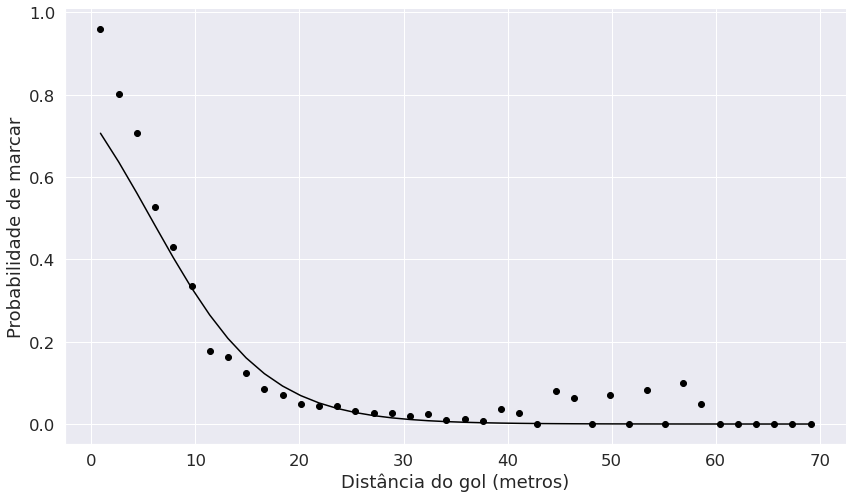

In [21]:
#Melhores parâmetros e utilizando distancia ao quadrado 
# *processo no arquivo funcoes_projeto.py
b_distancia=modelo_teste_dist.params
print(b_distancia)
plot_prob(tipo= 'likelihood otimizado distancia', b= -b_distancia)  

#### Agora temos um aumento na probabilidade que faz maior sentido dado o que explicamos acima. Vamos adicionar o tipo de lance como mais variaveis preditoras já que podem haver diferentes comportamentos nos diferentes tipos de lance terminados em chute.

In [22]:
#Dummização das variáveis categóricas
chutes_modelo_dummies= pd.get_dummies(chutes_modelo.drop(columns= ['Campeonato']), drop_first= False)

chutes_modelo_dummies.columns= ['Gol', 'X', 'Y', 'idTime', 'idJogador', 
                                'distanciaCentro', 'distanciaGol', 'Angulo', 'distanciaQuadrado', 
                                'free_kick_shot', 'penalty', 'shot', 'counter_attack']

In [23]:
variaveis_preditoras = chutes_modelo_dummies.drop(columns= ['X', 'Y', 'Gol', 'idTime', 'idJogador']).columns
modelo_todas_as_variaveis = smf.glm(formula="Gol ~ " + escreve_modelo(variaveis_preditoras), 
                                    data=chutes_modelo_dummies, 
                           family=sm.families.Binomial()).fit()

print(modelo_todas_as_variaveis.summary())        

                 Generalized Linear Model Regression Results                  
Dep. Variable:                    Gol   No. Observations:                38868
Model:                            GLM   Df Residuals:                    38860
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11245.
Date:                Fri, 16 Apr 2021   Deviance:                       22489.
Time:                        21:51:33   Pearson chi2:                 3.98e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.6601      0.13

### Os valores p sendo menores que 0.05 para cada variável nos indicam que todas estão sendo importantes para predizer se um chute será ou não gol.

#### O tipo de lance em que dá origem ao chute, porém, nos retorna uma melhor predição do modelo. Seus coeficientes nos indicam aspectos importantes e que parecem fazer sentido: 

#### a) a probabilidade de um gol sair em cobrança de penâlti é a mais alta de todos os tipos de lances considerados. O que faz total sentido tendo em vista que há menos oposição na batida, o ângulo é "perfeito" e a distância em relação ao gol é bem curta. Os chutes de falta tem a segunda maior probabilidade de resultar em gol entre os tipos de lance considerados; 

#### b) já os chutes em organização ofensiva nos indica uma probabilidade negativa de ocorrer, já que é mais comum os chutes que não resultam em gol e 

#### c) ideia similar está presente no contra ataque, porém, este indicando uma probabilidade ainda menor de gol. O que nos faz levantar a hipósete de que as equipes tiveram maior dificuldade em  marcar a partir de contra ataque nos campeonatos e temporadas que os nossos dados representam.

#### As melhores variáveis preditoras que temos, isto é, aquelas que mais influencias em uma chance maior de ser gol são: 1ª) se o chute foi proveniente de uma penalidade e 2ª) o ângulo que o jogador possui em relação ao gol. Assim, o fato de estar pouco ou mais centralizado em relação ao gol é o fator, dentre as variáveis que criamos, que mais influencia na probabilidade de uma finalização terminar em gol.

### Vamos manter, portanto, um modelo com as variáveis:

##### a) 'distanciaCentro' -> distância do chute em relação ao centro (supondo que todos os campos tenham o mesmo comprimento, isto é, 100 metros de profundidade e 65 de amplitude);

##### b) 'distanciaGol' -> Distância do chute em relação ao gol (mesma ideia presente em distanciaCentro referente ao tamanho do campo);

##### c) 'Angulo -> o ângulo que o atleta tinha ao dar o chute;

##### d) ''distanciaQuadrado' -> a distância em relação ao gol elevada ao quadrado;

##### e) 'free_kick_shot' -> chute dado a partir de falta ;       

##### f) 'penalty' -> chute dado a partir de uma penalidade;             

##### g) 'shot' -> chute dado com a equipe em organização ofensiva e                

##### h) 'counter_attack' -> chute dado a partir de contra ataque.    

# Adicionando xG ao dataset

#### *A função de cálculo do xG - calcula_xg() - se encontra no arquivo funcoes_projeto.py

In [24]:
#Melhores coeficientes para as variáveis preditoras mantidas
b=modelo_todas_as_variaveis.params 
print(b)

Intercept            0.660067
distanciaCentro     -0.018071
distanciaGol        -0.199229
Angulo               1.233675
distanciaQuadrado    0.001886
free_kick_shot       0.536741
penalty              1.517529
shot                -0.388120
counter_attack      -1.006084
dtype: float64


In [25]:
#Adiciona xG ao dataframe chutes_modelo
variaveis_preditoras= ['distanciaCentro', 'distanciaGol', 'Angulo', 'distanciaQuadrado', 
                       'free_kick_shot', 'penalty', 'shot', 'counter_attack']
lista_xG= []

#Calculando xG
for i, chute in chutes_modelo_dummies.iterrows():
    xG=calcula_xG(df= chute, variaveis_preditoras= variaveis_preditoras, coeficientes= b)
    lista_xG.append(xG)

#Adicionando xG's calculados
chutes_modelo_com_xg = chutes_modelo_dummies.assign(xG=lista_xG)

#Adicionando campeonatos em que o chute foi dado novamente
chutes_modelo_com_xg= chutes_modelo_com_xg.assign(campeonato= chutes_modelo['Campeonato'].values)

#Salvando dataframe com xG para análises de qualidade de chances criadas
chutes_modelo_com_xg.to_csv('chutes_modelo_com_xg.csv', index=False)

# Mapa 2D de xG

#### *Função feita somente com 4 variáveis, isto é, antes de inserirmos o tipo de lance como variável preditora no modelo. A imagem 2D se encontra na pasta Imagens do repositório.

prob_gol_2d=np.zeros((65,65))
for x in range(65):
    for y in range(65):
        
        chute=dict()
        
        angulo = np.arctan(7.32 *x /(x**2 + abs(y-65/2)**2 - (7.32/2)**2))
        
        if angulo<0:
            angulo = np.pi + angulo
        
        chute['Angulo'] = angulo
        
        chute['distanciaGol'] = np.sqrt(x**2 + abs(y-65/2)**2)
        
        chute['distanciaQuadrado'] = x**2 + abs(y-65/2)**2
        
        chute['X'] = x
        
        chute['distanciaCentro'] = abs(y-65/2)
        
        
        prob_gol_2d[x,y] =  calcula_xG(df= chute, 
                                       variaveis_preditoras= variaveis_preditoras, 
                                       coeficientes= b)


(fig,ax) = FCPython.createGoalMouth()

pos=ax.imshow(prob_gol_2d, extent=[-1,65,65,-1], aspect='auto',cmap=plt.cm.Reds,vmin=0, vmax=0.3)

fig.colorbar(pos, ax=ax)

ax.set_title('Probabilidade de gol por Distâncias e Ângulo')

plt.xlim((0,66))

plt.ylim((-3,35))

plt.gca().set_aspect('equal', adjustable='box');

fig.savefig('Imagens/prob_gol_por_' + escreve_modelo(variaveis_preditoras) + '.pdf', 
            dpi=None, bbox_inches="tight")

# Performance do Modelo

#### Vamos fazer predições se um chute foi ou não gol dado as variáveis selecionadas e analisar como é a performance do nosso modelo olhando a taxa de acertos quando gol e quando não. Para isso, vamos utilizar a variável xG que já inserimos no dataset. A ideia é iterar em diferentes valores de thresholds e fazer predições comparando, em um gráfico, as taxas de acerto pra gol e não gol em cada threshold usado.

#### *Threshold -> quantos porcentos de probabilidade de gol uma finalização precisa ter, no minímo, para ser classificada como resultada em gol?

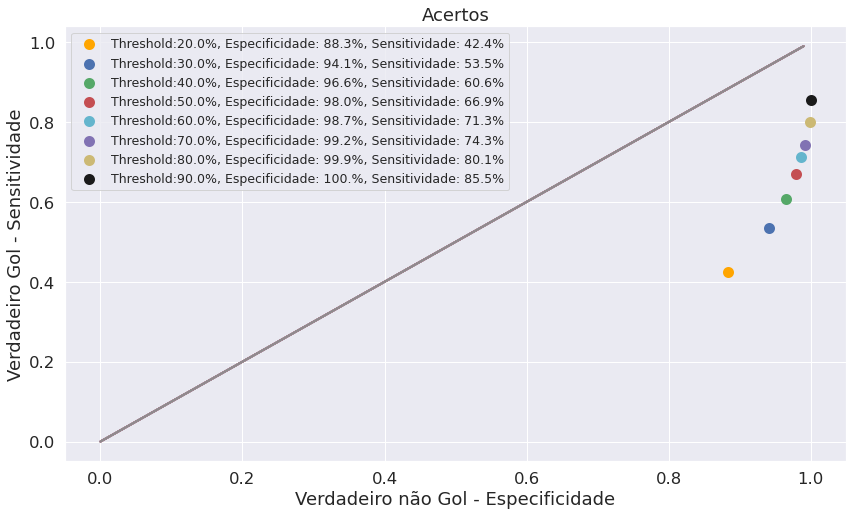

In [26]:
df_para_predicoes= chutes_modelo_com_xg[['Gol', 'xG']] 
lista_threshold= [.20, .30, .40, .50, .60, .70, .80, .90]

plot_metricas_e_thresh(df= df_para_predicoes, 
                       y_true= df_para_predicoes['Gol'], 
                       lista_thresh= lista_threshold, save= True)

#### Cada círculo no gráfico representa as predições feitas com o threshold associado na legenda. A linha no meio do gráfico nos mostra o local onde a taxa de acertos para gols e não gols seria exatamente igual. Nesse sentido, como todas os círculos estão abaixo da linha, isto nos indica que a especificidade (taxa de acertos de quando não é gol) é maior em nosso modelo independente do threshold utilizado. No futebol, geralmente, é necessário que várias finalizações sejam feitas pra que um gol ocorra e isso é justamente um dos elementos que tornam o momento do gol um momento especial; não comum; uma conquista. É este mesmo fator que, provalmente, facilita a predição do modelo para chutes que não foram gols.

#### Porém, percebemos que com o aumento do threshold há também um movimento de subida das taxas de acerto nas predições de gols. Isto nos indica que temos um modelo que se elevarmos o threshold para predizer se um chute foi ou não gol, o nível de predição é bastante alto. Nesse sentido, nossos xGs estão com um cálculo bem apurado levando em conta as variáveis que escolhemos como preditoras, o que nos permite confiar nas análises que faremos de clubes, campeonatos, temporadas e jogadores presentes em nossos dados.

# Semi Conclusão

#### *É importante salientar que o modelo poderia ser melhorado ao pensarmos em possíveis outras características das finalizações a serem utilizadas, tais como: 

#### 1) Jogadores adversários ou da mesma equipe próximos à bola no momento do chute: esses fatores influenciam no ângulo, na velocidade e na "tranquilidade" (em caso de pressão adversária) da finalização feita; 

#### 2) Uma mais difícil de ser implementada, mas que faz total sentido é indicar o atleta que fez a finalização: uma coisa é uma finalização feita por Messi ou Cristiano Ronaldo e outra por um jogador de nível menor que os dois atletas. Porém, como são muitos atletas e esta seria uma variável categórica, seria preciso pensar em problemas associados à sua implementação em termos de interpretação pelo modelo ou aumento da dimensionalidade e perda de performance e

#### 3) Indicar se o atleta finalizou com o pé considerado bom, o ruim ou com a cabeça.

### *Problema:*

#### 1) Como apontado, estamos considerando que todos os campos de futebol das partidas jogadas possuem o mesmo tamanho. Isso não leva a uma precisão absoluta em nosso modelo. Porém, as hipóteses levantadas aqui são corroboradas por pesquisas feitas com um número de dados maior, o que nos indica que a ideia principal em nossas hipóteses relacionadas ao tamanho do campo seguem um padrão de fato.